# Part 1: Detection of Fake / Real Profiles 

# Import libraries

In [32]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import pandas_profiling as pp
from pandas_profiling import ProfileReport
import keras as k
from sklearn.model_selection import train_test_split
import keras
from keras import regularizers
from keras.models import Sequential,model_from_json
from keras.layers import Dense, Dropout, Activation ,Conv1D, Dropout, Flatten, MaxPooling1D, Reshape
from keras import optimizers
from numpy.random import seed
seed(1)

# Read dataset

In [2]:
df_users = pd.read_csv("./dataset/users.csv")
df_fusers = pd.read_csv("./dataset/fusers.csv")

In [3]:
df_fusers.shape

(3351, 38)

In [4]:
df_users.shape

(3474, 42)

# Add isFake Column

In [5]:
#for df_users
isNotFake = np.zeros(3474)

#for df_fusers
isFake = np.ones(3351)

In [6]:
#adding is fake or not column to make predictions for it
df_fusers["isFake"] = isFake
df_users["isFake"] = isNotFake


# Combine different datasets into one

In [7]:
df_allUsers = pd.concat([df_fusers, df_users], ignore_index=True)
df_allUsers.columns = df_allUsers.columns.str.strip()

In [8]:
#to shuffle the whole data
df_allUsers = df_allUsers.sample(frac=1).reset_index(drop=True)

In [9]:
df_allUsers.describe()

,id,statuses_count,followers_count,friends_count,favourites_count,listed_count,default_profile,default_profile_image,geo_enabled,profile_use_background_image,...,is_translator,follow_request_sent,protected,verified,notifications,contributors_enabled,following,isFake,test_set_1,test_set_2
count,6.825000e+03,6825.000000,6825.000000,6825.000000,6825.000000,6825.000000,4066.0,19.0,2294.0,6426.0,...,1.0,0.0,78.0,11.0,0.0,0.0,0.0,6825.000000,3474.000000,3474.000000
mean,8.499737e+08,8667.221685,717.874432,504.022564,2378.999121,9.959853,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.490989,0.287853,0.141048
std,7.662248e+08,23473.945131,12301.657025,1159.286294,8548.235726,112.952257,0.0,0.0,0.0,0.0,...,NaN,NaN,0.0,0.0,NaN,NaN,NaN,0.499955,0.452827,0.348121
min,6.780330e+05,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
25%,2.597067e+08,23.000000,12.000000,206.000000,0.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
50%,6.168972e+08,190.000000,33.000000,312.000000,10.000000,0.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,0.000000,0.000000,0.000000
75%,1.174963e+09,6900.000000,349.000000,555.000000,1360.000000,2.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,0.000000
max,3.164942e+09,399555.000000,986837.000000,46310.000000,313954.000000,6166.000000,1.0,1.0,1.0,1.0,...,1.0,NaN,1.0,1.0,NaN,NaN,NaN,1.000000,1.000000,1.000000


In [10]:
df_allUsers.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,notifications,description,contributors_enabled,following,updated,isFake,timestamp,crawled_at,test_set_1,test_set_2
0,154856763,olobnew1,olobnew1,0,3,502,0,0,Sat Jun 12 11:39:51 +0000 2010,NaN,...,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
1,1130403349,Rocky Coffey,RockyCoffey1,20,12,241,0,0,Tue Jan 29 08:05:57 +0000 2013,NaN,...,NaN,#teamfollowback becaue yo want to .,NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
2,618758991,Tashina Oconnor,tashinabwg,20,11,282,0,0,Tue Jun 26 03:14:10 +0000 2012,NaN,...,NaN,"Reggaeton, Rp, Hip - Hop R& 24/7",NaN,NaN,2013-06-12 18:38:35,1.0,NaN,NaN,NaN,NaN
3,2387366902,Ceddie ✨,HannahCedra,5361,435,375,1193,0,Thu Mar 06 04:34:47 +0000 2014,NaN,...,NaN,UofM17 BusinessMajor- Accountingsnapchat: cedr...,NaN,NaN,2016-03-15 15:56:46,0.0,2014-03-06 05:34:47,2015-05-01 12:56:24,0.0,0.0
4,555411470,salman Ali,MSalmanAli96,17732,1013,693,9557,1,Mon Apr 16 20:47:58 +0000 2012,NaN,...,NaN,Keep Calm and wait for your turn #ShiaGenocide...,NaN,NaN,2016-03-15 15:58:29,0.0,2012-04-16 22:47:58,2015-05-01 13:59:39,1.0,1.0


# Distribution of Data in X and Y

In [11]:
Y = df_allUsers.isFake

In [12]:
df_allUsers.drop(["isFake"], axis=1, inplace=True)
X = df_allUsers

In [15]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Render HTML: 100%|██████████| 1/1 [00:03<00:00,  3.07s/it]


In [13]:
Y.reset_index(drop=True, inplace=True)

In [14]:
print(Y.shape)

(6825,)


In [15]:
X.head()

,id,name,screen_name,statuses_count,followers_count,friends_count,favourites_count,listed_count,created_at,url,...,verified,notifications,description,contributors_enabled,following,updated,timestamp,crawled_at,test_set_1,test_set_2
0,154856763,olobnew1,olobnew1,0,3,502,0,0,Sat Jun 12 11:39:51 +0000 2010,NaN,...,NaN,NaN,NaN,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
1,1130403349,Rocky Coffey,RockyCoffey1,20,12,241,0,0,Tue Jan 29 08:05:57 +0000 2013,NaN,...,NaN,NaN,#teamfollowback becaue yo want to .,NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
2,618758991,Tashina Oconnor,tashinabwg,20,11,282,0,0,Tue Jun 26 03:14:10 +0000 2012,NaN,...,NaN,NaN,"Reggaeton, Rp, Hip - Hop R& 24/7",NaN,NaN,2013-06-12 18:38:35,NaN,NaN,NaN,NaN
3,2387366902,Ceddie ✨,HannahCedra,5361,435,375,1193,0,Thu Mar 06 04:34:47 +0000 2014,NaN,...,NaN,NaN,UofM17 BusinessMajor- Accountingsnapchat: cedr...,NaN,NaN,2016-03-15 15:56:46,2014-03-06 05:34:47,2015-05-01 12:56:24,0.0,0.0
4,555411470,salman Ali,MSalmanAli96,17732,1013,693,9557,1,Mon Apr 16 20:47:58 +0000 2012,NaN,...,NaN,NaN,Keep Calm and wait for your turn #ShiaGenocide...,NaN,NaN,2016-03-15 15:58:29,2012-04-16 22:47:58,2015-05-01 13:59:39,1.0,1.0


In [16]:
lang_list = list(enumerate(np.unique(X["lang"])))
lang_dict = {name : i for i, name in lang_list}
X.loc[:, "lang_num"] = X["lang"].map(lambda x: lang_dict[x]).astype(int)

X.drop(["name"], axis=1, inplace=True)

In [17]:
print(lang_dict)

{'Select Language...': 0, 'ar': 1, 'da': 2, 'de': 3, 'el': 4, 'en': 5, 'en-AU': 6, 'en-GB': 7, 'en-gb': 8, 'es': 9, 'fil': 10, 'fr': 11, 'id': 12, 'it': 13, 'ja': 14, 'ko': 15, 'nl': 16, 'pl': 17, 'pt': 18, 'ru': 19, 'sv': 20, 'tr': 21, 'xx-lc': 22, 'zh-TW': 23, 'zh-cn': 24, 'zh-tw': 25}


# Feature Selection

In [18]:
X = X[[
    "statuses_count",
    "followers_count",
    "friends_count",
    "favourites_count",
    "lang_num",
    "listed_count",
    "geo_enabled",
    "profile_use_background_image"
                        ]]

In [22]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.05s/it]


In [19]:
X = X.replace(np.nan, 0) #To replace the missing boolean values with zeros as it means false

In [24]:
profile = ProfileReport(X, title="Pandas Profiling Report")
profile

Render HTML: 100%|██████████| 1/1 [00:01<00:00,  1.07s/it]


# Import Data

In [20]:
train_X, test_X, train_y, test_y = train_test_split(X, Y, train_size=0.8, test_size=0.2, random_state=0)
train_X, val_X, train_y, val_y = train_test_split(train_X, train_y, train_size=0.8, test_size=0.2, random_state=0)

In [21]:
print(train_X.shape)
print(test_X.shape)
print(train_y.shape)
print(test_y.shape)

(4368, 8)
(1365, 8)
(4368,)
(1365,)


# ANN Model

In [53]:
model = Sequential()
model.add(Dense(32, activation='relu', input_dim=8))
model.add(Dense(64, input_dim=32, activation='relu'))
model.add(Dense(64, input_dim=64, activation='relu'))
model.add(Dense(32,input_dim=64, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_10 (Dense)            (None, 32)                288       
                                                                 
 dense_11 (Dense)            (None, 64)                2112      
                                                                 
 dense_12 (Dense)            (None, 64)                4160      
                                                                 
 dense_13 (Dense)            (None, 32)                2080      
                                                                 
 dense_14 (Dense)            (None, 1)                 33        
                                                                 
Total params: 8,673
Trainable params: 8,673
Non-trainable params: 0
_________________________________________________________________


# Compile Model

In [54]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['accuracy'])

# Training

In [55]:
history = model.fit(train_X, train_y,
                    epochs=15,
                    verbose=1,
                    validation_data=(val_X,val_y))

Epoch 1/15
137/137 [==============================] - 1s 3ms/step - loss: 1.2808 - accuracy: 0.9663 - val_loss: 2.5818 - val_accuracy: 0.9817
Epoch 2/15
137/137 [==============================] - 0s 2ms/step - loss: 0.4104 - accuracy: 0.9771 - val_loss: 2.8450 - val_accuracy: 0.9789
Epoch 3/15
137/137 [==============================] - 0s 2ms/step - loss: 0.3662 - accuracy: 0.9789 - val_loss: 1.2872 - val_accuracy: 0.9808
Epoch 4/15
137/137 [==============================] - 0s 2ms/step - loss: 0.3089 - accuracy: 0.9785 - val_loss: 1.7738 - val_accuracy: 0.9780
Epoch 5/15
137/137 [==============================] - 0s 2ms/step - loss: 0.2400 - accuracy: 0.9796 - val_loss: 0.8677 - val_accuracy: 0.9853
Epoch 6/15
137/137 [==============================] - 0s 2ms/step - loss: 0.2091 - accuracy: 0.9812 - val_loss: 1.7397 - val_accuracy: 0.9780
Epoch 7/15
137/137 [==============================] - 0s 2ms/step - loss: 0.6938 - accuracy: 0.9748 - val_loss: 3.9794 - val_accuracy: 0.9817
Epoch 

# Testing

In [56]:
score = model.evaluate(test_X, test_y, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Test loss: 0.1632351577281952
Test accuracy: 0.9846153855323792


# Graphs

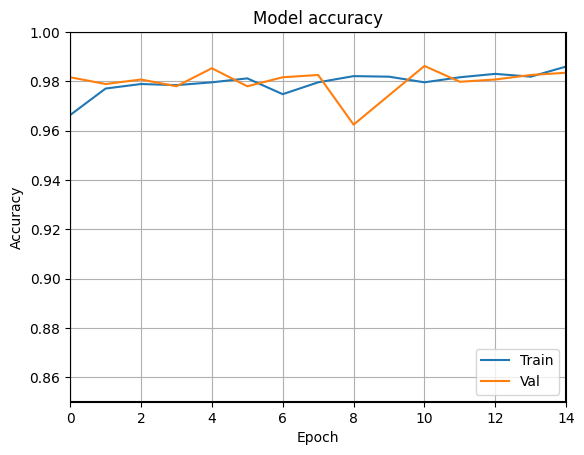

In [57]:
# Plot training and validation accuracy values
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0.85,1])
axes.grid(True, which='both')
axes.axhline(y=0.85, color='k')
axes.axvline(x=0, color='k')
axes.axvline(x=14, color='k')
axes.axhline(y=1, color='k')
plt.legend(['Train','Val'], loc='lower right')
plt.show()

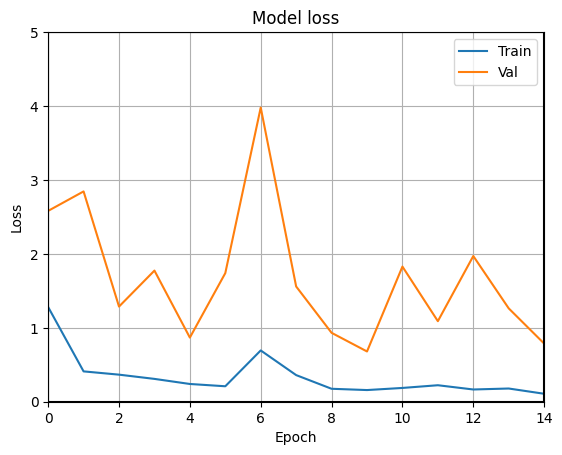

In [58]:
# Plot training and validation loss values
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0,5])
axes.grid(True, which='both')
axes.axhline(y=0, color='k')
axes.axvline(x=0, color='k')
axes.axhline(y=5, color='k')
axes.axvline(x=14, color='k')
plt.legend(['Train','Val'], loc='upper right')
plt.show()

# Building a CNN model

In [47]:
model_cnn = Sequential()
model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu', input_shape=(train_X.shape[1], 1)))
model_cnn.add(Conv1D(filters=64, kernel_size=2, activation='relu'))
model_cnn.add(Dropout(0.5))
model_cnn.add(MaxPooling1D(pool_size=2))
model_cnn.add(Flatten())
model_cnn.add(Dense(10, activation='relu'))
model_cnn.add(Dense(1, activation='sigmoid'))
model_cnn.compile(loss='binary_crossentropy', optimizer='adam', metrics=['accuracy'])

In [60]:
model_cnn.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv1d_8 (Conv1D)           (None, 7, 64)             192       
                                                                 
 conv1d_9 (Conv1D)           (None, 6, 64)             8256      
                                                                 
 dropout_4 (Dropout)         (None, 6, 64)             0         
                                                                 
 max_pooling1d_4 (MaxPooling  (None, 3, 64)            0         
 1D)                                                             
                                                                 
 flatten_4 (Flatten)         (None, 192)               0         
                                                                 
 dense_8 (Dense)             (None, 10)                1930      
                                                      

In [48]:
# Reshaping trining input for CNN
arr_train = np.array(train_X)

In [49]:
#Training the CNN
history_cnn = model_cnn.fit(arr_train, train_y,
                    epochs=15,
                    verbose=1,
                    validation_data=(val_X,val_y))

Epoch 1/15
137/137 [==============================] - 2s 5ms/step - loss: 2.7660 - accuracy: 0.9032 - val_loss: 2.9937 - val_accuracy: 0.9716
Epoch 2/15
137/137 [==============================] - 0s 3ms/step - loss: 0.9366 - accuracy: 0.9510 - val_loss: 3.1817 - val_accuracy: 0.9771
Epoch 3/15
137/137 [==============================] - 0s 3ms/step - loss: 0.8250 - accuracy: 0.9693 - val_loss: 2.6457 - val_accuracy: 0.9789
Epoch 4/15
137/137 [==============================] - 0s 4ms/step - loss: 0.4893 - accuracy: 0.9666 - val_loss: 1.8321 - val_accuracy: 0.9698
Epoch 5/15
137/137 [==============================] - 0s 3ms/step - loss: 1.4280 - accuracy: 0.9416 - val_loss: 2.1574 - val_accuracy: 0.9579
Epoch 6/15
137/137 [==============================] - 0s 3ms/step - loss: 0.6052 - accuracy: 0.9478 - val_loss: 1.9930 - val_accuracy: 0.9643
Epoch 7/15
137/137 [==============================] - 0s 3ms/step - loss: 0.3327 - accuracy: 0.9517 - val_loss: 1.8250 - val_accuracy: 0.9487
Epoch 

In [50]:
#Evaluating CNN

score_cnn = model_cnn.evaluate(np.array(test_X), test_y, verbose=0)
print('Test loss:', score_cnn[0])
print('Test accuracy:', score_cnn[1])

Test loss: 0.1090686246752739
Test accuracy: 0.9743589758872986


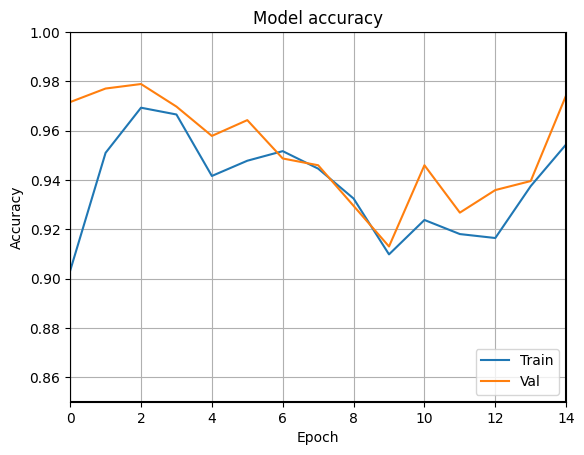

In [51]:
# Plot training and validation accuracy values
plt.plot(history_cnn.history['accuracy'])
plt.plot(history_cnn.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0.85,1])
axes.grid(True, which='both')
axes.axhline(y=0.85, color='k')
axes.axvline(x=0, color='k')
axes.axvline(x=14, color='k')
axes.axhline(y=1, color='k')
plt.legend(['Train','Val'], loc='lower right')
plt.show()

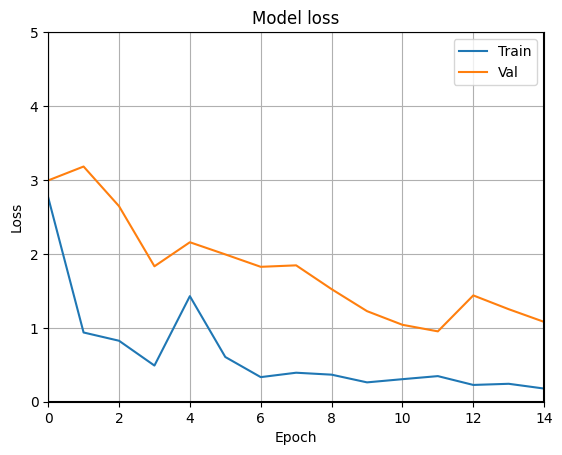

In [52]:
# Plot training and validation loss values
plt.plot(history_cnn.history['loss'])
plt.plot(history_cnn.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
axes = plt.gca()
axes.set_xlim([0,14])
axes.set_ylim([0,5])
axes.grid(True, which='both')
axes.axhline(y=0, color='k')
axes.axvline(x=0, color='k')
axes.axhline(y=5, color='k')
axes.axvline(x=14, color='k')
plt.legend(['Train','Val'], loc='upper right')
plt.show()

### ANN Model has a validation accuraccy of 98.46 %
### CNN Model has a validation accuraccy of 97.43 %

### Hence we choose the ANN odel for final predictions

# Prediction

In [34]:
# Write the index of the test sample to test
prediction = model.predict(test_X[136:137])
prediction = prediction[0]
print('Prediction\n',prediction)
print('\nThresholded output\n',(prediction>0.5)*1)

1/1 [==============================] - 0s 85ms/step
Prediction
 [0.9966832]

Thresholded output
 [1]


# Ground truth

In [35]:
print(test_y[136:137])

5389    1.0
Name: isFake, dtype: float64


In [38]:
print(test_X[136:137])

      statuses_count  followers_count  friends_count  favourites_count  \
5389              19                9            178                 0   

      lang_num  listed_count  geo_enabled  profile_use_background_image  
5389         5             0          0.0                           1.0  



# Part 2: Saving, Loading Model

# Saving

In [36]:
# serialize model to JSON
model_json = model.to_json()

# Write the file name of the model

with open("model.json", "w") as json_file:
    json_file.write(model_json)
    
# serialize weights to HDF5
# Write the file name of the weights

model.save_weights("model.h5")
print("Saved model to disk")

Saved model to disk


# Loading

In [37]:
# load json and create model

# Write the file name of the model

json_file = open('model.json', 'r')
loaded_model_json = json_file.read()
json_file.close()
loaded_model = model_from_json(loaded_model_json)

# load weights into new model
# Write the file name of the weights

loaded_model.load_weights("model.h5")
print("Loaded model from disk")

Loaded model from disk
